# Import the libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
%matplotlib inline

from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

# Import the Data

2 Baskets of securities in the spreadsheet, PF1 and PF2

In sheet PF1
    a mix of stocks, commodities and stock indexes
    Amazon, American Airlines, SP500, Euronext100, Gold, Oil
    
In sheet PF2
    CenterPoint Energy(CNP), Ford, Walmart, General Electric, Tesla, Toyota
    
Change the sheet_name parameter below to be 'PF1' or 'PF2'

In [2]:
df = pd.read_excel(io='../Data/Portfolio.xlsx', sheet_name='PF2', index_col = 'Date')

# Display the first 5 and last 5 rows
pd.concat([df.head(), df.tail()])

,CNP,F,WMT,GE,TSLA,TM
Date,,,,,,
2019-05-01,29.247795,9.817699,99.006989,10.060271,234.009995,121.293808
2019-05-02,29.219288,9.855827,98.801857,10.209681,244.100006,120.968170
2019-05-03,29.599377,9.922548,99.710289,10.458698,255.029999,122.014153
2019-05-06,29.504354,9.884421,100.081451,10.388973,255.339996,121.353020
2019-05-07,29.276300,9.893953,98.948395,10.070231,247.059998,120.879364
2020-05-20,16.920000,5.490000,125.449997,6.420000,815.559998,119.820000
2020-05-21,16.760000,5.630000,124.989998,6.480000,827.599976,117.949997
2020-05-22,16.920000,5.650000,124.330002,6.410000,816.880005,117.559998
2020-05-26,17.490000,5.840000,123.860001,6.800000,818.869995,124.110001


In [3]:
import yfinance as yf

stocks = 'META AMZN NFLX GOOGL TSLA F JPM GLD CL=F'.split()
df = yf.download(stocks, '2020-1-1', auto_adjust=True)['Close']

df = df[-253:]

df

[*********************100%***********************]  9 of 9 completed


Ticker,AMZN,CL=F,F,GLD,GOOGL,JPM,META,NFLX,TSLA
Date,,,,,,,,,
2024-11-14,211.479996,68.699997,10.306319,237.009995,174.809097,236.856003,575.350891,837.260010,311.179993
2024-11-15,202.610001,67.019997,10.250460,236.589996,171.732666,240.224701,552.343262,823.960022,320.720001
2024-11-18,201.699997,69.160004,10.436663,241.089996,174.530319,239.950485,552.662231,847.049988,338.739990
2024-11-19,204.610001,69.389999,10.287700,243.250000,177.337921,238.050705,559.331299,871.320007,346.000000
2024-11-20,202.880005,68.870003,9.989775,244.619995,175.207321,235.788589,563.747437,883.849976,342.029999
...,...,...,...,...,...,...,...,...,...
2025-11-10,248.399994,60.130001,13.160000,378.380005,290.100006,316.890015,631.760010,1120.069946,445.230011
2025-11-11,249.100006,61.040001,13.300000,379.869995,291.309998,315.619995,627.080017,1136.439941,439.619995
2025-11-12,244.199997,58.490002,13.450000,385.989990,286.709991,320.410004,609.010010,1157.500000,430.600006


# Plot some Charts

Nothing sophisticated, just enough to see how the various securities have performed

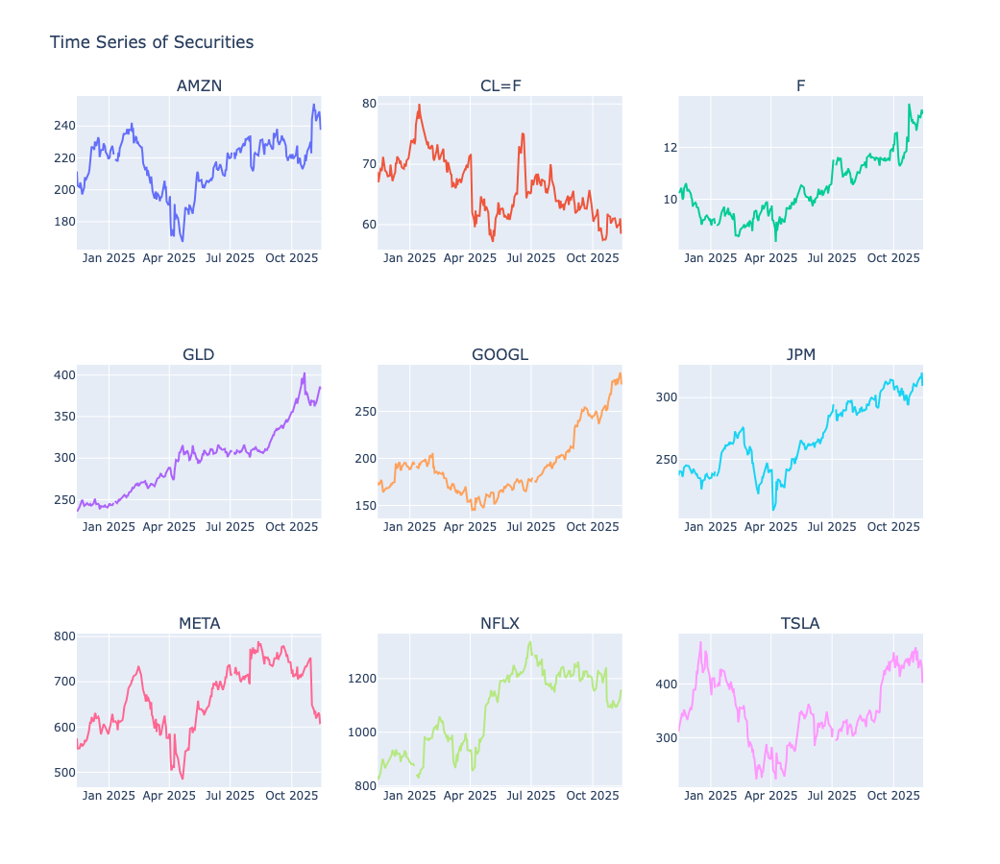

In [4]:
from plotly.subplots import make_subplots

# Number of securities
num_securities = len(df.columns)

# Create 3x3 subplot grid
fig = make_subplots(
    rows=3, cols=3,
    subplot_titles=df.columns
)

# Add each security as a subplot
for i, col in enumerate(df.columns):
    row = (i // 3) + 1
    col_pos = (i % 3) + 1
    fig.add_trace(
        go.Scatter(x=df.index, y=df[col], mode='lines', name=col, showlegend=False),
        row=row, col=col_pos
    )

# Update layout
fig.update_layout(
    height=900, width=900,
    title_text="Time Series of Securities",
)

fig.show()

# Perform some calculations

- Daily returns
- Annual returns
- Daily covariance of daily returns
- Annual covariance of daily returns

**Note** these do not beed to be for a year, they do need to be for the period in question

In [5]:
daily_ret = df.pct_change(fill_method=None)

NUM_DAYS = daily_ret.count()

annual_ret = daily_ret.mean() * NUM_DAYS

cov_daily = daily_ret.cov()

cov_annual = cov_daily * NUM_DAYS

# Calculate the Efficient frontier

Obtained by simulating imaginary combinations of portfolios 
(50,000 portfolios of different combinations in this case).

In [6]:
# set the number of combinations for imaginary portfolios
NUM_ASSETS = len(df.columns)
NUM_PORTFOLIOS = 50000


In [7]:
# empty lists to store returns, volatility and weights of imiginary portfolios
port_returns = []
port_volatility = []
stock_weights = []


In [8]:
# populate the empty lists with each portfolios returns,risk and weights

for portfolio in range(NUM_PORTFOLIOS):
    
    weights = np.random.random(NUM_ASSETS)
    weights /= np.sum(weights)
    
    returns = np.dot(weights, annual_ret)
    
    volatility = np.sqrt(np.dot(weights.T, np.dot(cov_annual, weights)))
    
    port_returns.append(returns)
    port_volatility.append(volatility)
    stock_weights.append(weights)
    
# Create a dictionary for Returns and Risk values of each portfolio
portfolio = {'Returns': port_returns,
             'Volatility': port_volatility}


In [9]:
# extend original dictionary to accomodate each ticker and weight in the portfolio
assets = df.columns

for counter,asset in enumerate(assets):
    portfolio[asset+' Weight'] = [Weight[counter] for Weight in stock_weights]


In [10]:
# make a nice dataframe of the extended dictionary
df_portfolio = pd.DataFrame(portfolio)

df_portfolio.head()

,Returns,Volatility,AMZN Weight,CL=F Weight,F Weight,GLD Weight,GOOGL Weight,JPM Weight,META Weight,NFLX Weight,TSLA Weight
0,0.423700,0.266758,0.116926,0.036790,0.101979,0.115090,0.286805,0.021052,0.023104,0.095838,0.202417
1,0.367083,0.221992,0.050226,0.077183,0.133616,0.184485,0.134066,0.019266,0.114914,0.140573,0.145671
2,0.254290,0.215140,0.198532,0.115766,0.128903,0.060487,0.039866,0.144198,0.157565,0.126446,0.028237
3,0.281394,0.223304,0.143357,0.166272,0.094771,0.070381,0.172272,0.130800,0.111003,0.027315,0.083829
4,0.289309,0.195602,0.183072,0.183278,0.114225,0.091771,0.133986,0.078632,0.003278,0.184841,0.026918


# Visualize the Efficient Frontier for this portfolio

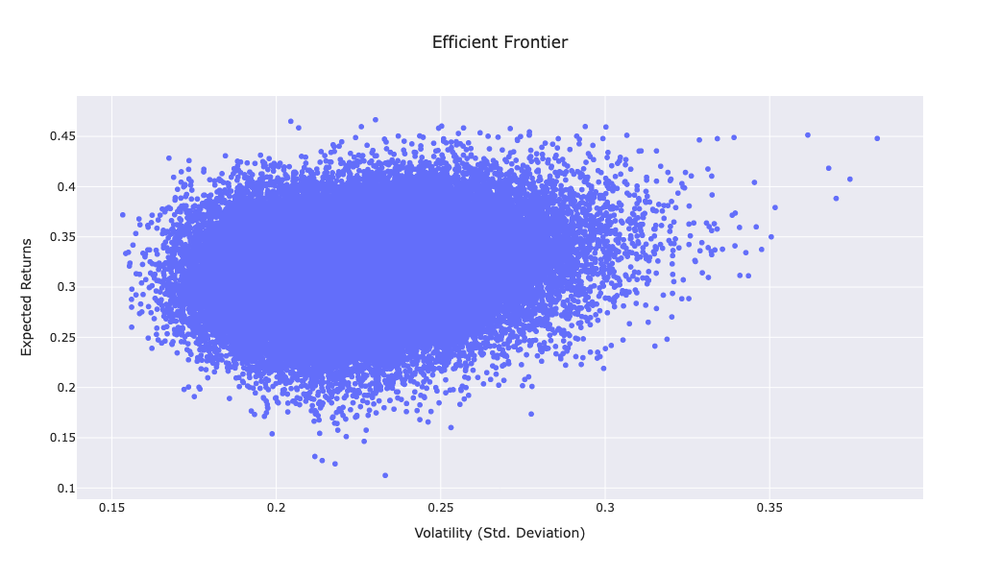

In [11]:
fig = px.scatter(
    df_portfolio,
    x="Volatility",
    y="Returns",
    title="Efficient Frontier",
    labels={"Volatility": "Volatility (Std. Deviation)", "Returns": "Expected Returns"},
)

# Make it look like seaborn
fig.update_layout(
    template="seaborn",
    width=800,
    height=600
)

fig.show()

# Calculate the Sharpe Ratio

50,000 portfolios with different combinations of weights generated different expected returns and expected volatility. <BR>
Each point lying on the line represents an optimal combination of assets in a portfolio that maximises the expected return for the given level of risk <BR>
<BR><BR>
If all points on the Efficient Frontier curve are optimal combinations
- What is the optimal portfolio among the various optimal combinations? 
- What would even the criteria for choosing this *best of the best* combinations?
    
**Sharpe Ratio**<BR>
Use the `Sharpe Ratio` to measure the performance of an investments returns given its risk.
This ratio adjusts the returns of an investment which makes it possible to compare different investments on a scale that incorporates risk. <BR>
Without this scale of comparison, it would be virtually impossible to compare different investments with different combinations and their accompanying risks and returns.
    
    
The expected returns and returns of our simulated portfolios are already known. <BR>
Repeat the above process but include a calculation their risk-adjusted returns (with the help of the Sharpe Ratio), and make a colour bar of the plots using the Sharpe Ratio as the colour map

In [12]:
# empty lists to store returns, volatility and weights of imiginary portfolios
port_returns = []
port_volatility = []
stock_weights = []
sharpe_ratio = []

#set random seed for reproduction's sake
np.random.seed(42)

for portfolio in range(NUM_PORTFOLIOS):
    
    weights = np.random.random(NUM_ASSETS)
    weights /= np.sum(weights)
    
    returns = np.dot(weights, annual_ret)
    
    volatility = np.sqrt(np.dot(weights.T, np.dot(cov_annual, weights)))
    
    sharpe = returns / volatility
    sharpe_ratio.append(sharpe)
    
    port_returns.append(returns)
    port_volatility.append(volatility)
    stock_weights.append(weights)
    
# Create a dictionary for Returns and Risk values of each portfolio
portfolio = {'Returns': port_returns,
             'Volatility': port_volatility,
             'Sharpe Ratio': sharpe_ratio}

# extend original dictionary to accomodate each ticker and weight in the portfolio
assets = df.columns

for counter,asset in enumerate(assets):
    portfolio[asset+' Weight'] = [Weight[counter] for Weight in stock_weights]
    
# make a nice dataframe of the extended dictionary
df_portfolio = pd.DataFrame(portfolio)


In [16]:
print(df_portfolio.columns)
print(df_portfolio.shape)

print(df_portfolio.head(3))

Index(['Returns', 'Volatility', 'Sharpe Ratio', 'AMZN Weight', 'CL=F Weight',
       'F Weight', 'GLD Weight', 'GOOGL Weight', 'JPM Weight', 'META Weight',
       'NFLX Weight', 'TSLA Weight'],
      dtype='object')
(50000, 12)
    Returns  Volatility  Sharpe Ratio  AMZN Weight  CL=F Weight  F Weight  \
0  0.297344    0.210524      1.412396     0.083355     0.211585  0.162908   
1  0.374109    0.221412      1.689647     0.179824     0.005228  0.246322   
2  0.306978    0.220132      1.394518     0.120859     0.081487  0.171198   

   GLD Weight  GOOGL Weight  JPM Weight  META Weight  NFLX Weight  TSLA Weight  
0    0.133234      0.034723    0.034717     0.012927     0.192771     0.133780  
1    0.211410      0.053926    0.046177     0.046578     0.077266     0.133269  
2    0.039031      0.081743    0.102509     0.127610     0.219694     0.055869  


# Visualize the Efficient Frontier for this portfolio

In [17]:
# Ensure these three DataFrames exist
df_portfolio = df_portfolio.copy()  # optional safety

# 1. Portfolio with maximum Sharpe ratio
max_sharpe_port = df_portfolio.loc[[df_portfolio['Sharpe Ratio'].idxmax()]]

# 2. Portfolio with minimum volatility
min_vol_port = df_portfolio.loc[[df_portfolio['Volatility'].idxmin()]]

# 3. Optional: print summary
print("Max Sharpe Portfolio:")
display(max_sharpe_port)

print("Min Volatility Portfolio:")
display(min_vol_port)

Max Sharpe Portfolio:


,Returns,Volatility,Sharpe Ratio,AMZN Weight,CL=F Weight,F Weight,GLD Weight,GOOGL Weight,JPM Weight,META Weight,NFLX Weight,TSLA Weight
3134,0.414703,0.161176,2.572978,0.11488,0.004666,0.066959,0.426276,0.138304,0.047063,0.051359,0.134213,0.01628


Min Volatility Portfolio:


,Returns,Volatility,Sharpe Ratio,AMZN Weight,CL=F Weight,F Weight,GLD Weight,GOOGL Weight,JPM Weight,META Weight,NFLX Weight,TSLA Weight
42209,0.312127,0.153125,2.038383,0.144624,0.122751,0.188769,0.348022,0.009398,0.118252,0.02753,0.035392,0.005262


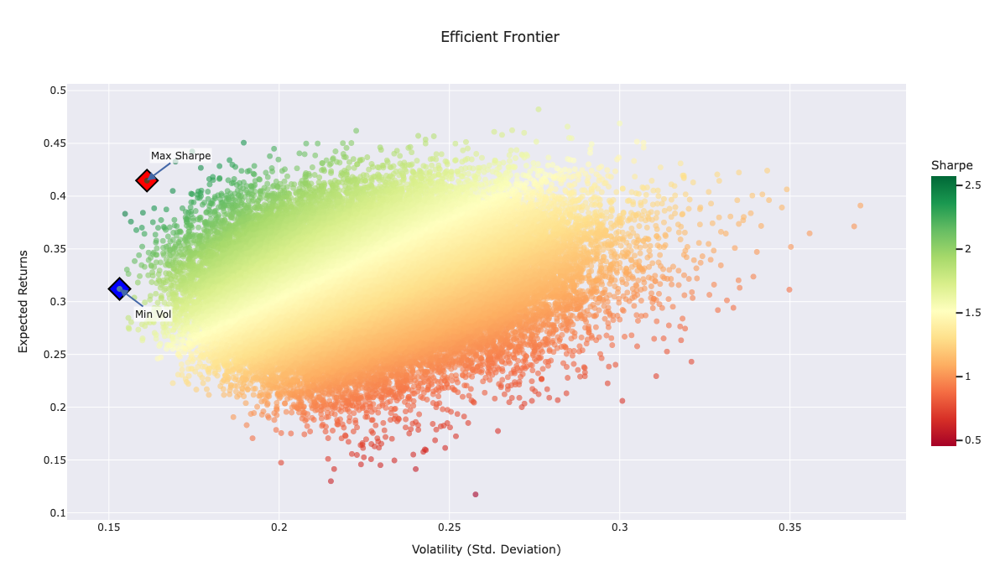

In [18]:
import plotly.express as px
import plotly.graph_objects as go

# --- Base scatter, toned down so highlights stand out ---
fig = px.scatter(
    df_portfolio,
    x="Volatility",
    y="Returns",
    color="Sharpe Ratio",
    color_continuous_scale="RdYlGn",
    title="Efficient Frontier",
    labels={"Volatility": "Volatility (Std. Deviation)",
            "Returns": "Expected Returns",
            "Sharpe Ratio": "Sharpe Ratio"},
)

# De-emphasize the cloud a bit
fig.update_traces(marker=dict(size=7, opacity=0.6), selector=dict(mode="markers"))

# --- Extract scalars ---
max_vol = float(max_sharpe_port["Volatility"].iloc[0])
max_ret = float(max_sharpe_port["Returns"].iloc[0])
min_vol = float(min_vol_port["Volatility"].iloc[0])
min_ret = float(min_vol_port["Returns"].iloc[0])

# --- Optional: helper for rich hover text (same as before) ---
def make_hover_text(row):
    sharpe_col = next((c for c in ["Sharpe Ratio","Sharpe","sharpe","sharpe_ratio"] if c in row.index), None)
    weight_cols = [c for c in row.index if ("weight" in c.lower()) or c.lower().startswith("w_")]
    parts = [f"<b>Volatility</b>: {row['Volatility']:.4f}",
             f"<b>Return</b>: {row['Returns']:.4f}"]
    if sharpe_col: parts.append(f"<b>Sharpe</b>: {row[sharpe_col]:.4f}")
    if weight_cols:
        parts.append("<b>Weights</b>:")
        parts += [f"• {c}: {float(row[c]):.2%}" for c in weight_cols]
    return "<br>".join(parts)

max_hover = make_hover_text(max_sharpe_port.iloc[0])
min_hover = make_hover_text(min_vol_port.iloc[0])

# --- Add highlighted diamonds (big, outlined, no legend) ---
fig.add_trace(go.Scatter(
    x=[max_vol], y=[max_ret], mode="markers",
    marker=dict(symbol="diamond", size=20, color="red",
                line=dict(color="black", width=2)),
    name="Max Sharpe", showlegend=False,
    hovertemplate=max_hover + "<extra></extra>",
))

fig.add_trace(go.Scatter(
    x=[min_vol], y=[min_ret], mode="markers",
    marker=dict(symbol="diamond", size=20, color="blue",
                line=dict(color="black", width=2)),
    name="Min Volatility", showlegend=False,
    hovertemplate=min_hover + "<extra></extra>",
))

# --- Add on-chart labels (offset a bit so they don’t sit on the marker) ---
fig.add_annotation(
    x=max_vol, y=max_ret, text="Max Sharpe",
    showarrow=True, arrowhead=2, ax=40, ay=-30, bgcolor="rgba(255,255,255,0.7)"
)
fig.add_annotation(
    x=min_vol, y=min_ret, text="Min Vol",
    showarrow=True, arrowhead=2, ax=40, ay=30, bgcolor="rgba(255,255,255,0.7)"
)

# --- Tidy layout / colorbar ---
fig.update_layout(
    template="seaborn",
    width=900, height=700,
    coloraxis_colorbar=dict(title="Sharpe", len=0.7),
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="left", x=0)
)

fig.show()

# Locate the optimal Portfolio and least optimal portfilio


To get specific details of these two special portfolios

In [19]:
# print the details of the 2 special portfolios
print("Portfolio for Risk Averse investors")
print(min_vol_port.transpose())

print("\n\nPortfolio for Investors seeking max return")
print(max_sharpe_port.transpose())

Portfolio for Risk Averse investors
                 42209
Returns       0.312127
Volatility    0.153125
Sharpe Ratio  2.038383
AMZN Weight   0.144624
CL=F Weight   0.122751
F Weight      0.188769
GLD Weight    0.348022
GOOGL Weight  0.009398
JPM Weight    0.118252
META Weight   0.027530
NFLX Weight   0.035392
TSLA Weight   0.005262


Portfolio for Investors seeking max return
                  3134
Returns       0.414703
Volatility    0.161176
Sharpe Ratio  2.572978
AMZN Weight   0.114880
CL=F Weight   0.004666
F Weight      0.066959
GLD Weight    0.426276
GOOGL Weight  0.138304
JPM Weight    0.047063
META Weight   0.051359
NFLX Weight   0.134213
TSLA Weight   0.016280


**Risk-averse investors** <BR>
would construct the minimum volatility portfolio 

**Investors seeking maximum risk-adjusted return** <BR>
would construct the max Sharpe Ratio portfolio 